In [ ]:

#!pip install contextily pyproj torch numpy pandas matplotlib  scikit-learn tqdm pyarrow cartopy


Defaulting to user installation because normal site-packages is not writeable
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.6/9.6 MB 33.7 MB/s  0:00:00m0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 899.7/899.7 MB 77.6 MB/s  0:00:06m0:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 594.3/594.3 MB 129.2 MB/s  0:00:030:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.2/10.2 MB 61.9 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.0/88.0 MB 149.4 MB/s  0:00:00m0:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 954.8/954.8 kB 18.1 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 706.8/706.8 MB 121.6 MB/s  0:00:030:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.1/193.1 MB 210.0 MB/s  0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 19.7 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.6/63.6 MB 136.2 MB/s  0:00:00m0:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 267.5/267.5 MB 172.4 MB/

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import math
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
import joblib
from matplotlib.lines import Line2D
import pandas as pd
import contextily as cx
from pyproj import Transformer
from TransformerModel import TrajectoryTransformer30to10
from scaled_dataloader import load_train, load_val
from torch.utils.data import DataLoader
import cartopy.crs as ccrs
import cartopy.feature as cfeature




Using device: cpu


In [8]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [2]:
train_ds, scaler = load_train()
val_ds = load_val(scaler)

Loading TRAIN...
Initial data manipulation done, computing sliding windows and building x and y tensors . . .


100%|██████████| 59518/59518 [01:59<00:00, 497.48it/s]


Built tensor lists
Built full tensors
torch.Size([3773409, 30, 4]) torch.Size([3773409, 10, 4])
Loading VAL...
Initial data manipulation done, computing sliding windows and building x and y tensors . . .


100%|██████████| 12847/12847 [00:18<00:00, 704.09it/s]


Built tensor lists
Built full tensors
torch.Size([788039, 30, 4]) torch.Size([788039, 10, 4])


In [3]:
val_loader = DataLoader(val_ds, batch_size=1, shuffle=False)


In [4]:
model = TrajectoryTransformer30to10(
    input_dim=2,
    output_dim=2,
    d_model=256,
    nhead=8,
    num_layers=3,
    dim_feedforward=1024,
    dropout=0.1
)

model.load_state_dict(torch.load("/work/Deep Learning/checkpoints/B_medium.pt", map_location="cpu"))

model.eval()



TrajectoryTransformer30to10(
  (input_proj): Linear(in_features=2, out_features=256, bias=True)
  (pos_enc): PositionalEncoding()
  (encoder): TransformerEncoder(
    (layers): ModuleList(
      (0-2): 3 x TransformerEncoderLayer(
        (self_attn): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=256, out_features=256, bias=True)
        )
        (linear1): Linear(in_features=256, out_features=1024, bias=True)
        (dropout): Dropout(p=0.1, inplace=False)
        (linear2): Linear(in_features=1024, out_features=256, bias=True)
        (norm1): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
        (norm2): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
        (dropout1): Dropout(p=0.1, inplace=False)
        (dropout2): Dropout(p=0.1, inplace=False)
      )
    )
  )
  (out): Linear(in_features=256, out_features=20, bias=True)
)

In [5]:
def plot_paths(x_sample, y_true, y_pred, idx):
    # Past: shape (30,2)
    x_sample = x_sample.reshape(30, 2)

    # Future True: shape (10,2)
    y_true_sample = y_true.reshape(10, 2)

    # Pred Future: shape (10,2)
    y_pred_sample = y_pred.reshape(10, 2)
    
    plt.grid(True, alpha=0.5)
    plt.savefig(f'Trajectory Plot{idx}.png')
    plt.figure(figsize=(6,6))
    plt.plot(x_sample[:,0], x_sample[:,1], 'bo-', label='Past')
    plt.plot(y_true_sample[:,0], y_true_sample[:,1], 'go-', label='True')
    plt.plot(y_pred_sample[:,0], y_pred_sample[:,1], 'ro--', label='Pred')
    plt.axis("equal")
    plt.xlabel('Latitude')
    plt.ylabel('Longitude')
    plt.title(f'Trajectory Sample {idx}')
    plt.legend()
    plt.savefig(f'/work/Deep Learning/Plots/Trajectory Plot{idx}.png')
    
    #plt.show()



In [ ]:
#Evaluate Mean MSE; MAE and RSME of val set
se_sum = 0.0
ae_sum = 0.0
n_vals = 0

with torch.no_grad():
    for batch in val_loader:
        X_val, Y_val = batch if len(batch) == 2 else batch[:2]
        X_val, Y_val = X_val.to(device), Y_val.to(device)

        preds_val = model(X_val)  # (B, 10, 2)

        se = (preds_val - Y_val) ** 2
        ae = (preds_val - Y_val).abs()

        se_sum += se.sum().item()
        ae_sum += ae.sum().item()
        n_vals += se.numel()

mse  = se_sum / n_vals
rmse = math.sqrt(mse)
mae  = ae_sum / n_vals

print(f"Val MSE:  {mse:.6f}")
print(f"Val RMSE: {rmse:.6f}")
print(f"Val MAE:  {mae:.6f}")


Val MSE:  0.000000
Val RMSE: 0.000444
Val MAE:  0.000270


In [6]:
#Inverse scale the Data for plotting
def inverse_scale(coords_scaled, scaler):
    # coords_scaled: (N,2)
    N = coords_scaled.shape[0]
    return scaler.inverse_transform(coords_scaled.reshape(-1, 2)).reshape(N, 2)


In [9]:
#Find Metrics on inverse scaled data

se_sum = 0.0
ae_sum = 0.0
n_vals = 0

with torch.no_grad():
    for batch in val_loader:
        X_val, Y_val = batch if len(batch) == 2 else batch[:2]
        X_val, Y_val = X_val.to(device), Y_val.to(device)

        preds_val = model(X_val)  # (B, 10, 2)

        # On CPU + NumPy
        preds_np = preds_val.cpu().numpy()
        y_np     = Y_val.cpu().numpy()

        # (B, 10, 2) -> (B*10, 2)
        B, T, F = preds_np.shape
        preds_flat = preds_np.reshape(-1, F)
        y_flat     = y_np.reshape(-1, F)

        # inverse scaling
        # falls dein scaler nur auf LAT/LON trainiert wurde:
        preds_unscaled = scaler.inverse_transform(preds_flat)
        y_unscaled     = scaler.inverse_transform(y_flat)

        # Fehler in unskalierten Koordinaten
        diff = preds_unscaled - y_unscaled   # (B*10, 2)

        se_sum += (diff ** 2).sum()
        ae_sum += np.abs(diff).sum()
        n_vals += diff.size  # = B*10*2

mse_unscaled  = se_sum / n_vals
rmse_unscaled = np.sqrt(mse_unscaled)
mae_unscaled  = ae_sum / n_vals

print(f"Val MSE (unscaled LAT/LON):  {mse_unscaled:.6f}")
print(f"Val RMSE (unscaled LAT/LON): {rmse_unscaled:.6f}")
print(f"Val MAE (unscaled LAT/LON):  {mae_unscaled:.6f}")


Val MSE (unscaled LAT/LON):  0.001580
Val RMSE (unscaled LAT/LON): 0.039753
Val MAE (unscaled LAT/LON):  0.024193


/tmp/ipykernel_496/171376734.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(6,6))


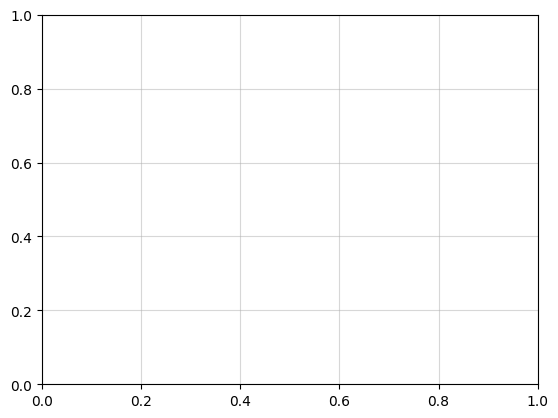

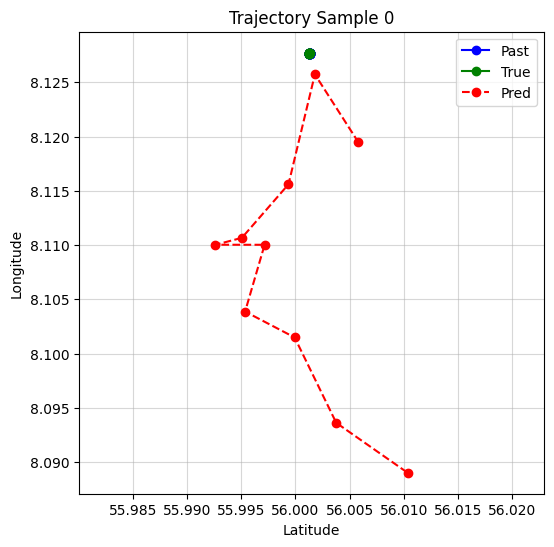

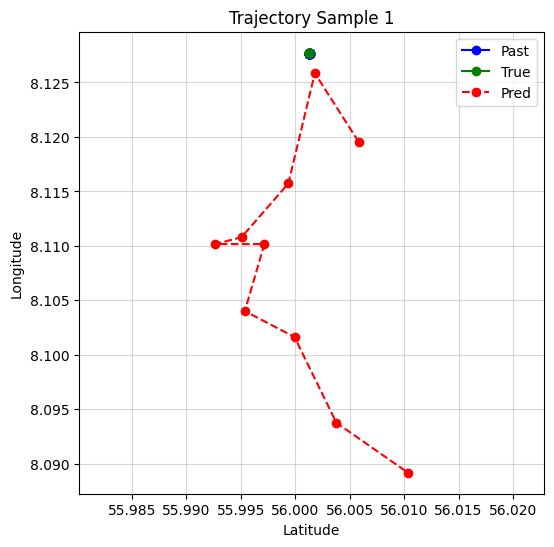

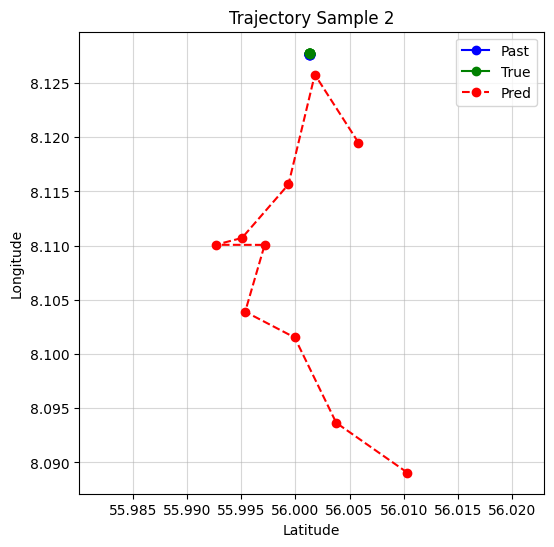

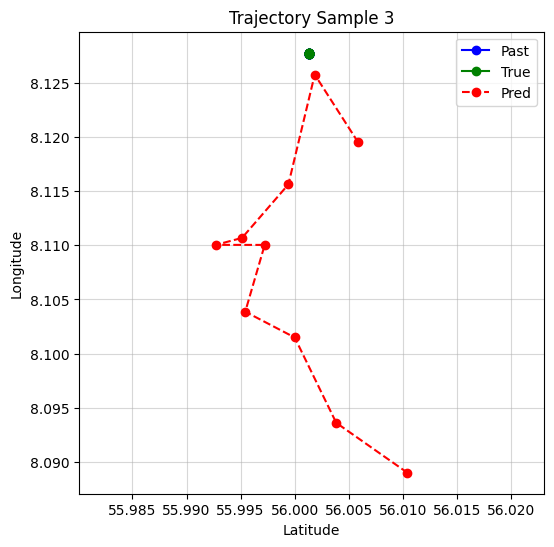

...

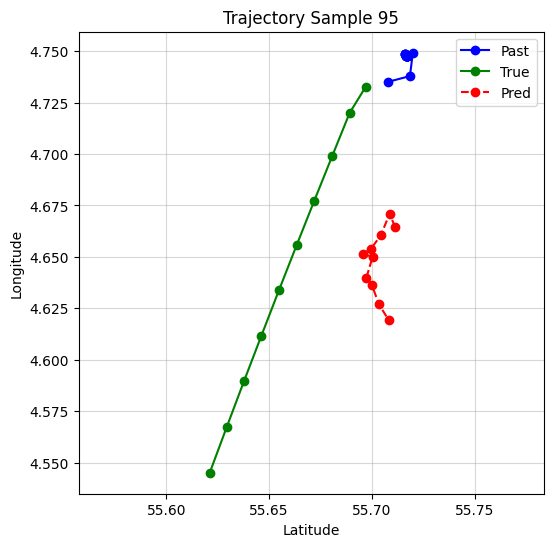

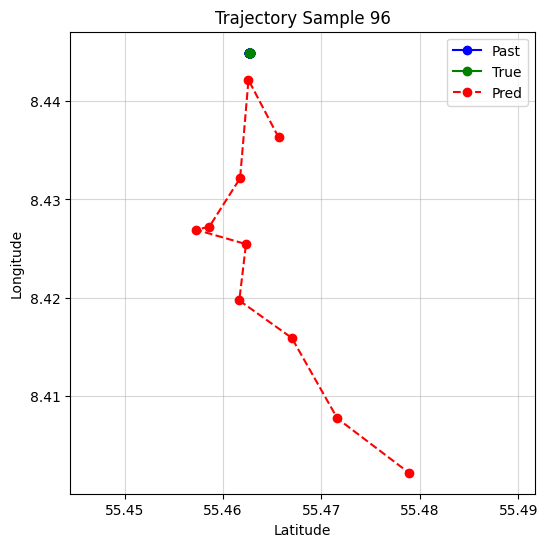

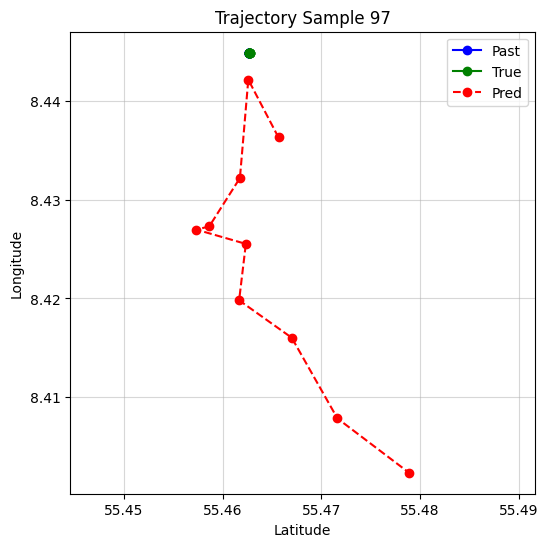

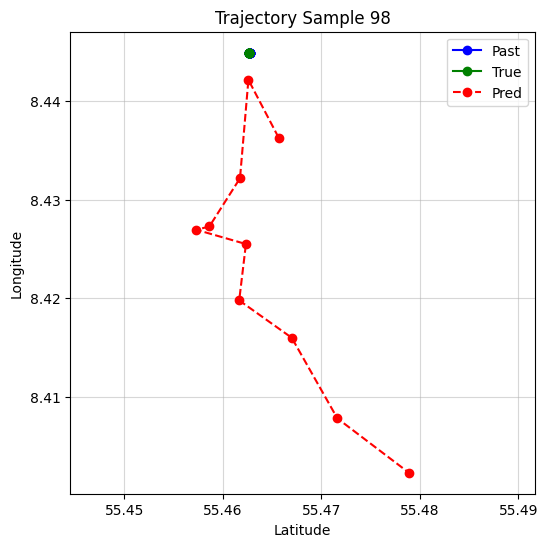

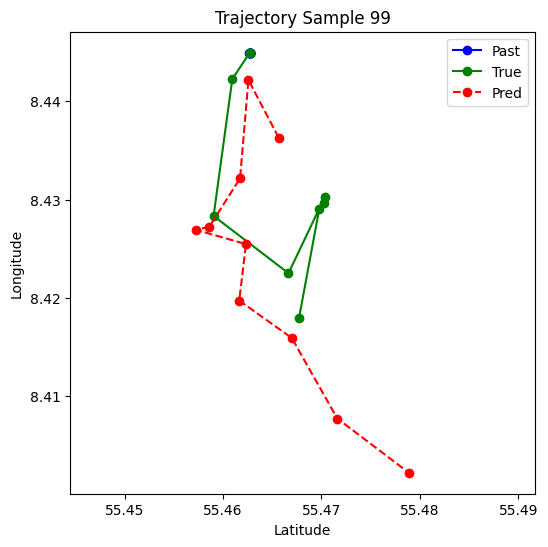

In [ ]:
num_samples_to_plot = 50


with torch.no_grad():
    for idx, batch in enumerate(val_loader):
        if idx >= num_samples_to_plot:
            break

        X_val, Y_val = batch if len(batch) == 2 else batch[:2]
        X_val, Y_val = X_val.to(device), Y_val.to(device)

        preds_val = model(X_val)  # (1,10,2)

        # to CPU numpy
        past_scaled     = X_val[0].cpu().numpy()   # (30,2)
        true_scaled     = Y_val[0].cpu().numpy()   # (10,2)
        pred_scaled     = preds_val[0].cpu().numpy()  # (10,2)

        # inverse scale LAT/LON
        past = inverse_scale(past_scaled, scaler)
        true = inverse_scale(true_scaled, scaler)
        pred = inverse_scale(pred_scaled, scaler)

        plot_paths(past, true, pred, idx)




/tmp/ipykernel_496/171376734.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(6,6))


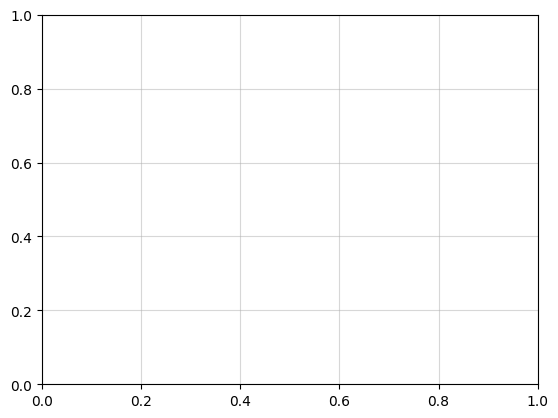

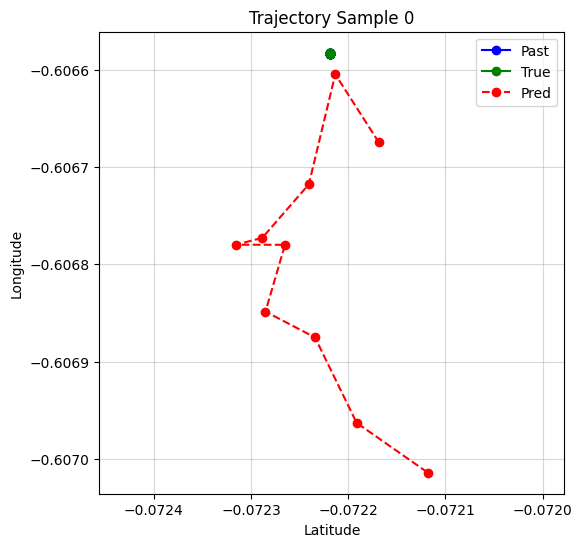

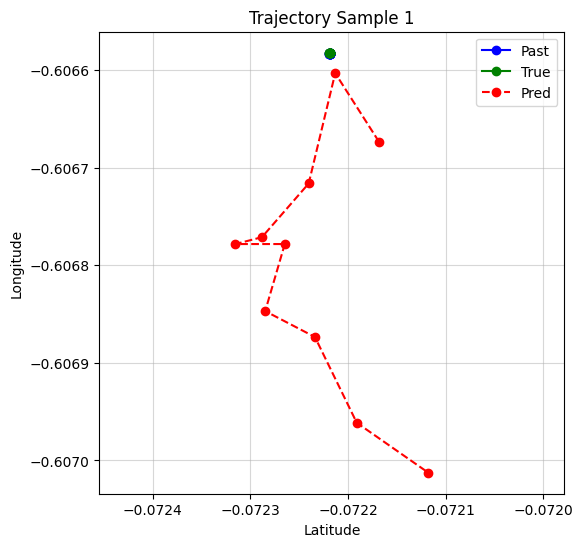

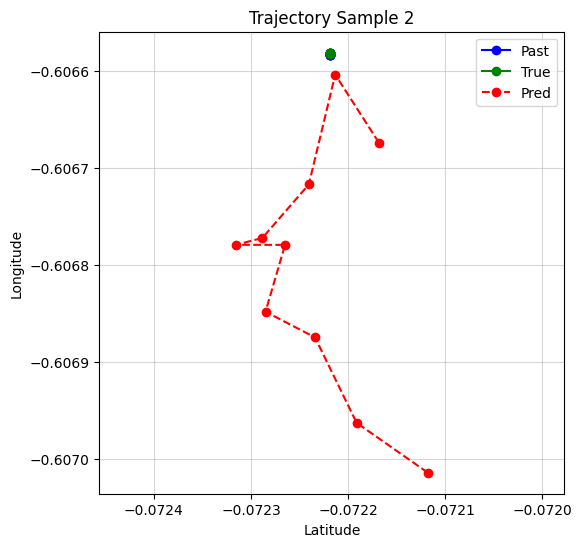

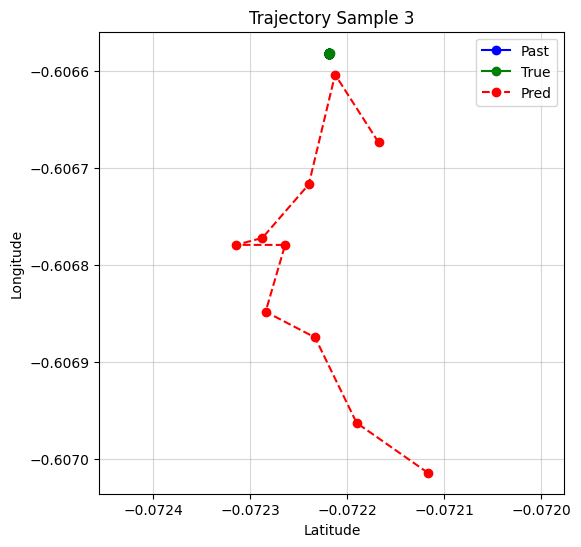

...

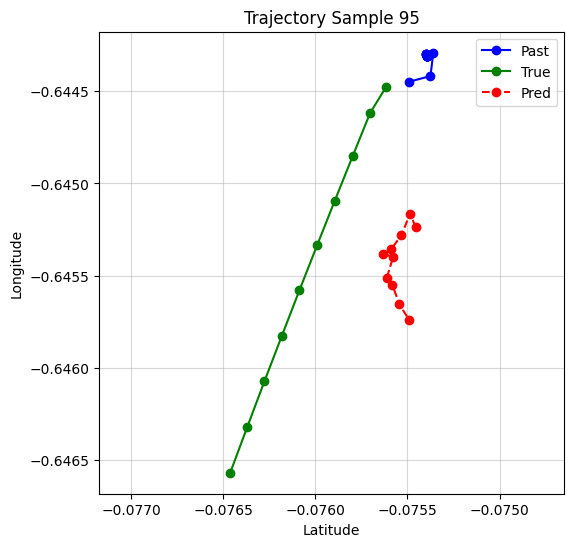

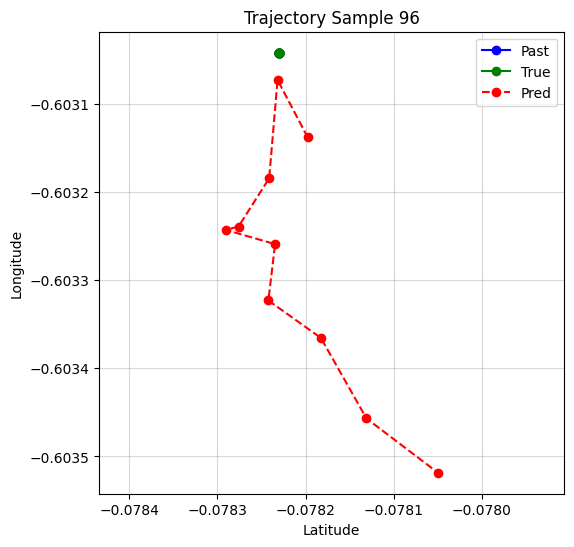

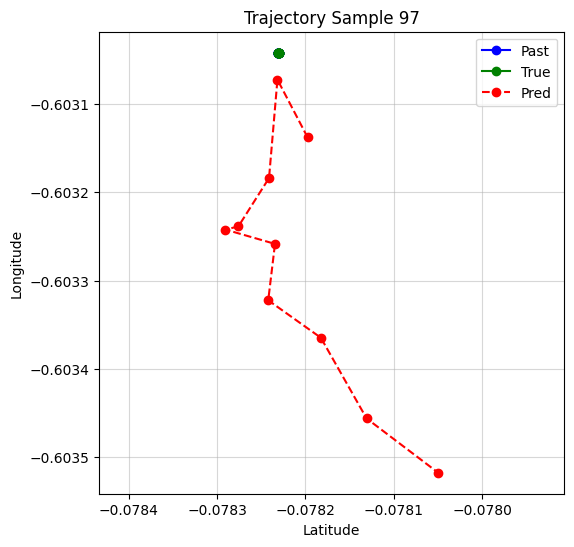

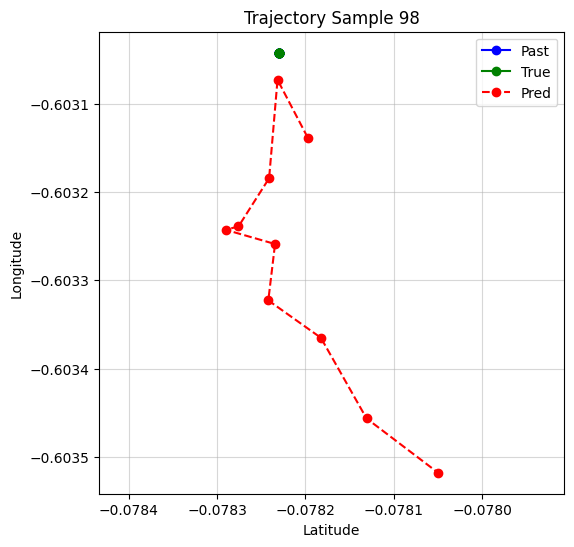

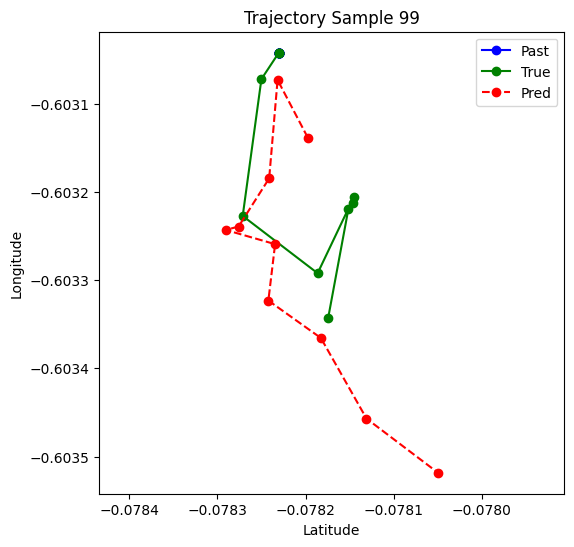

In [ ]:
num_samples_to_plot = 50

with torch.no_grad():
    for idx, batch in enumerate(val_loader):
        if idx >= num_samples_to_plot:
            break

        X_val, Y_val = batch if len(batch) == 2 else batch[:2]
        X_val, Y_val = X_val.to(device), Y_val.to(device)

        preds_val = model(X_val)  # (1,10,2)

        # to CPU numpy
        past_scaled     = X_val[0].cpu().numpy()   # (30,2)
        true_scaled     = Y_val[0].cpu().numpy()   # (10,2)
        pred_scaled     = preds_val[0].cpu().numpy()  # (10,2)

        # inverse scale LAT/LON
        past = inverse_scale(past_scaled, scaler)
        true = inverse_scale(true_scaled, scaler)
        pred = inverse_scale(pred_scaled, scaler)

        plot_paths(past, true, pred, idx)

In [52]:
def plot_on_map(x_sample, y_true, y_pred, idx):
    """
    Alle Eingaben: numpy-Arrays shape (N, 2) im skalierten Raum (LAT, LON).
    """
    # Past: shape (30,2)
    x_sample = x_sample.reshape(30, 2)

    # Future True: shape (10,2)
    y_true_sample = y_true.reshape(10, 2)

    # Pred Future: shape (10,2)
    y_pred_sample = y_pred.reshape(10, 2)


    # Koordinaten auseinanderziehen
    lat_p, lon_p = past[:, 0], past[:, 1]
    lat_t, lon_t = true[:, 0], true[:, 1]
    lat_r, lon_r = pred[:, 0], pred[:, 1]

    # Kartenprojektion
    proj = ccrs.PlateCarree()

    fig = plt.figure(figsize=(7, 7))
    ax = plt.axes(projection=proj)

    # Kartenausschnitt um die Trajektorie herum wählen
    margin = 0.05
    min_lon = min(lon_p.min(), lon_t.min(), lon_r.min()) - margin
    max_lon = max(lon_p.max(), lon_t.max(), lon_r.max()) + margin
    min_lat = min(lat_p.min(), lat_t.min(), lat_r.min()) - margin
    max_lat = max(lat_p.max(), lat_t.max(), lat_r.max()) + margin

    ax.set_extent([min_lon, max_lon, min_lat, max_lat], crs=proj)

    # Basis-Features
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS, linestyle=":")
    ax.add_feature(cfeature.LAND, alpha=0.1)
    ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)

    # Trajektorien plotten
    ax.plot(lon_p, lat_p, 'bo-', transform=proj, label="Past")
    ax.plot(lon_t, lat_t, 'go-', transform=proj, label="True")
    ax.plot(lon_r, lat_r, 'ro--', transform=proj, label="Predicted")

    ax.set_title(f"Trajectory Sample {idx} on map")
    ax.legend()
    plt.savefig(f"/work/Deep Learning/Plots/Trajectory Sample {idx} on map.png")
    plt.show()


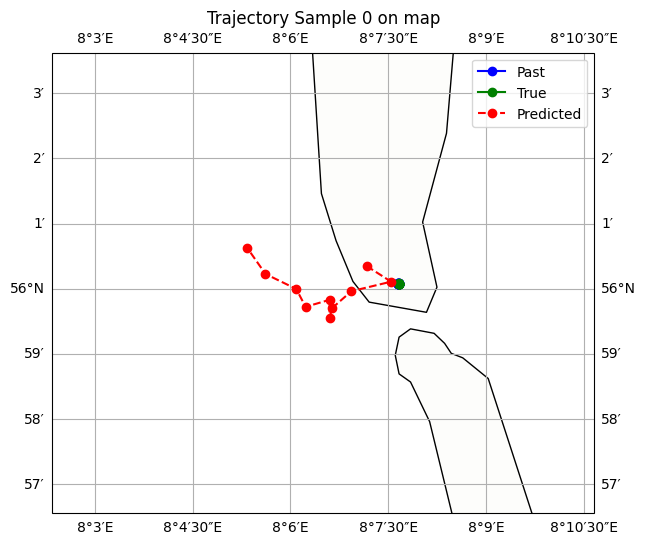

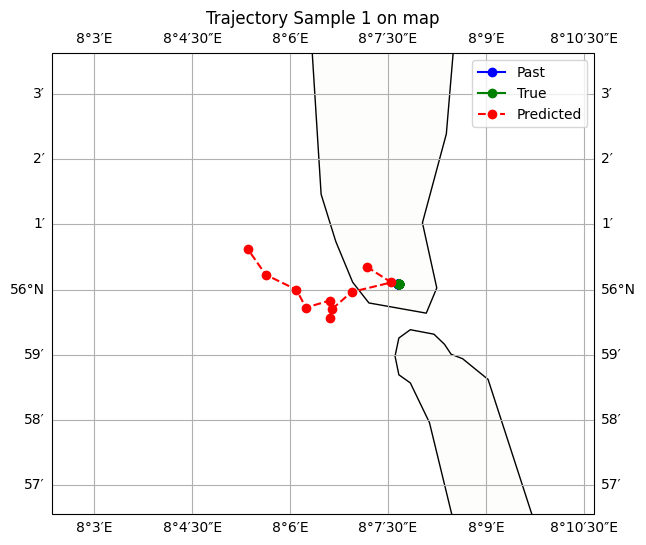

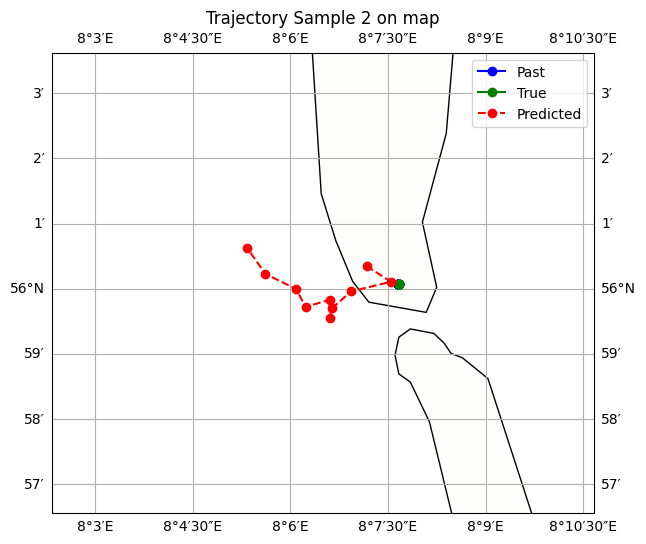

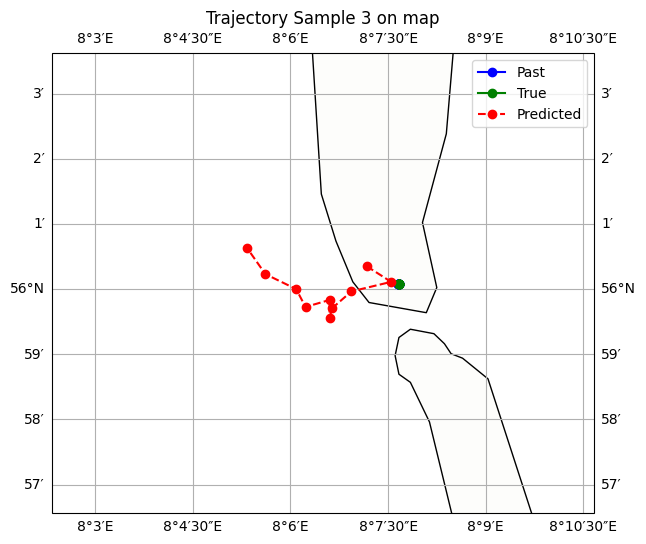

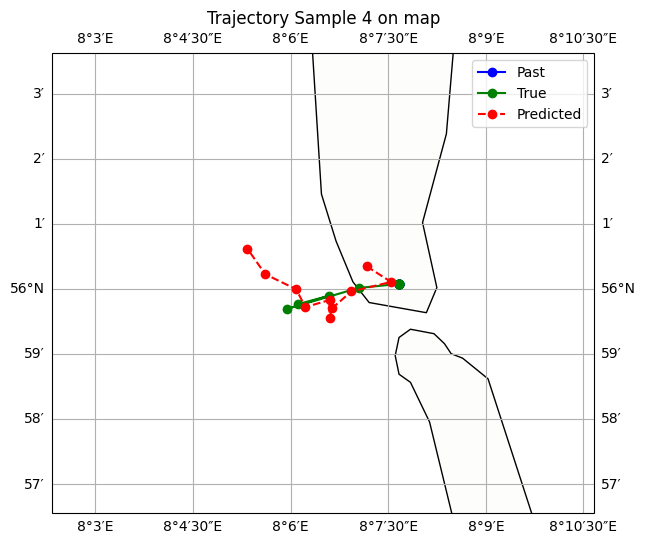

...

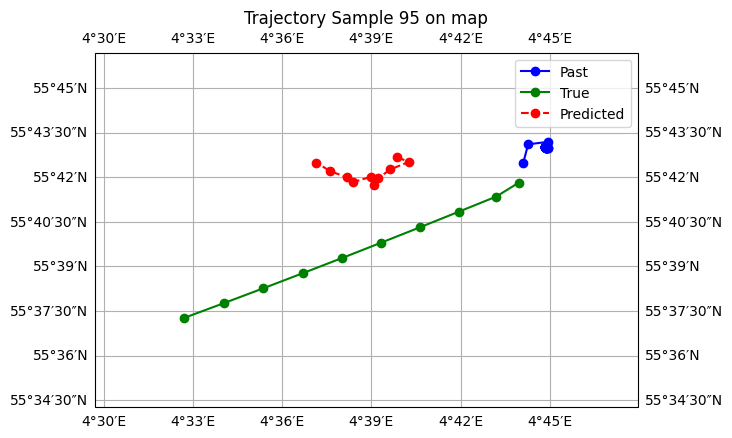

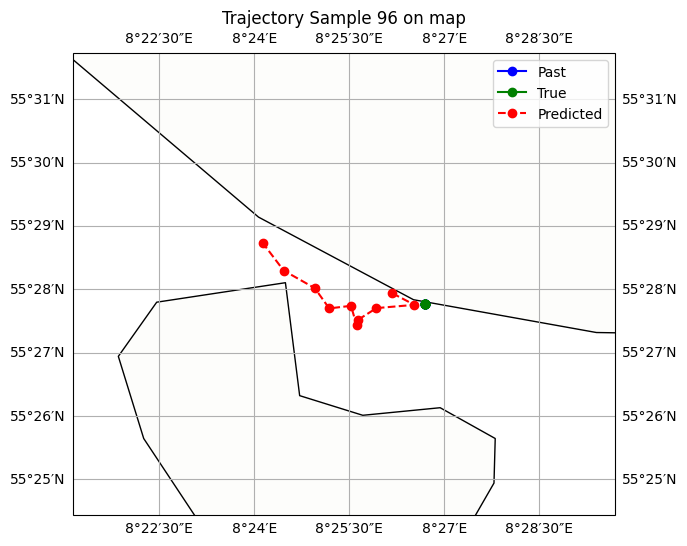

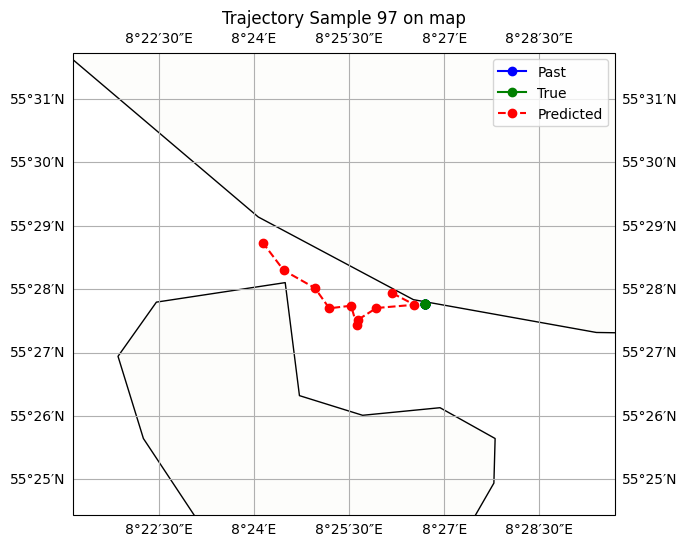

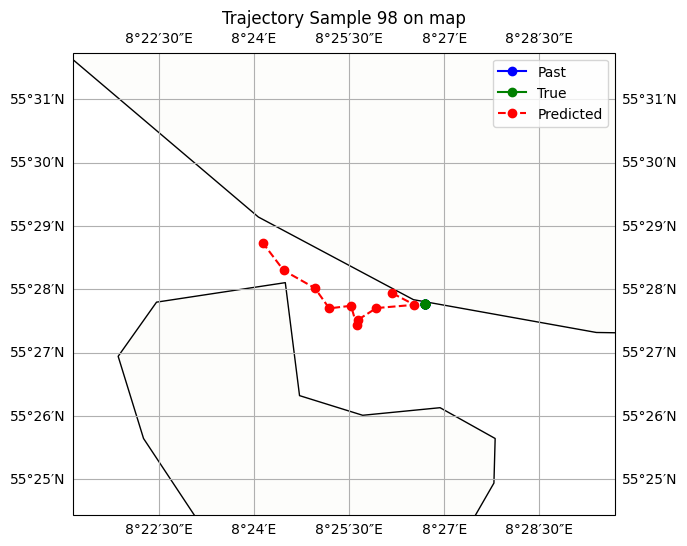

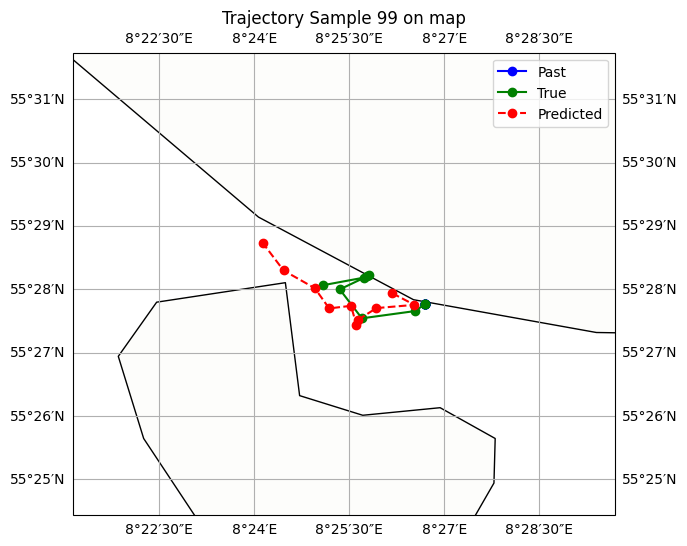

In [ ]:
num_samples_to_plot = 50  


with torch.no_grad():
    for idx, batch in enumerate(val_loader):
        if idx >= num_samples_to_plot:
            break

        X_val, Y_val = batch if len(batch) == 2 else batch[:2]
        X_val, Y_val = X_val.to(device), Y_val.to(device)

        preds_val = model(X_val)   # (1,10,2)

        

        past_scaled = X_val[0].cpu().numpy()    # (30,2)
        true_scaled = Y_val[0].cpu().numpy()    # (10,2)
        pred_scaled = preds_val[0].cpu().numpy()  # (10,2)

        # inverse scale LAT/LON
        past = inverse_scale(past_scaled, scaler)
        true = inverse_scale(true_scaled, scaler)
        pred = inverse_scale(pred_scaled, scaler)

        plot_on_map(past, true, pred, idx)
